In [16]:
# import libraries
import feedparser
from newspaper import Article
import requests
from PIL import Image
from io import BytesIO
from langchain.prompts import ChatPromptTemplate
from langchain_groq import ChatGroq
import os
from dotenv import load_dotenv

In [17]:
# load environment variables
load_dotenv()
api_key = os.getenv('GROQ_API_KEY')

llm = ChatGroq(model="openai/gpt-oss-120b")

# Quick test
test_response = llm.invoke("Hello! Can you confirm you are working?")
print(test_response.content)

Hello! I’m here and ready to help. How can I assist you today?


In [ ]:
# function to fetch news articles
#rss_url = "http://rss.cnn.com/rss/edition.rss"
def fetch_rss_articles(rss_url, limit=3):
    feed = feedparser.parse(rss_url)
    articles = []
    for entry in feed.entries[:limit]:
        articles.append({
            "title": entry.title,
            "link": entry.link,
            "image": entry.get("media_content", [{}])[0].get("url")   # pyright: ignore[reportOptionalSubscript]
        })
    return articles


In [19]:
#summarizing function
def summarize_article(url):
    article = Article(url)
    article.download()
    article.parse()
    prompt = ChatPromptTemplate.from_template("""
    Summarize the following news article in 3-4 sentences, focusing on the main points:
    {text}
    """)
    chain = prompt | llm
    return chain.invoke({"text": article.text}).content

In [20]:
# caption image function
def caption_image(image_url):
    if not image_url:
        return "No image available."
    try:
        # Show image inline
        response = requests.get(image_url)
        img = Image.open(BytesIO(response.content))
        display(img)
        
        # Generate caption (text-based LLM prompt)
        prompt = ChatPromptTemplate.from_template("""
        Generate a short descriptive caption for this news image.
        Focus on key objects and context in 1-2 sentences.
        {text}
        """)
        chain = prompt | llm
        caption = chain.invoke({"text": f"Image URL: {image_url}"}).content
        return caption
    except:
        return "Image could not be loaded."

1. Trump pleads not guilty to 34 felony counts
  Summary: A New York Supreme Court judge denied CNN and other outlets’ request to livestream former President Donald Trump’s arraignment, noting that while the hearing is public, live broadcast cameras are not normally permitted inside the courtroom. Instead, the judge authorized five pool photographers to take still images at the start of the proceeding until they are asked to leave the jury box. Trump’s lawyers also opposed live coverage, and the Manhattan District Attorney’s office took no position. The arraignment will likely include the unsealing of the hush‑money indictment that accuses Trump of illegal campaign‑related payments, charges he continues to deny.


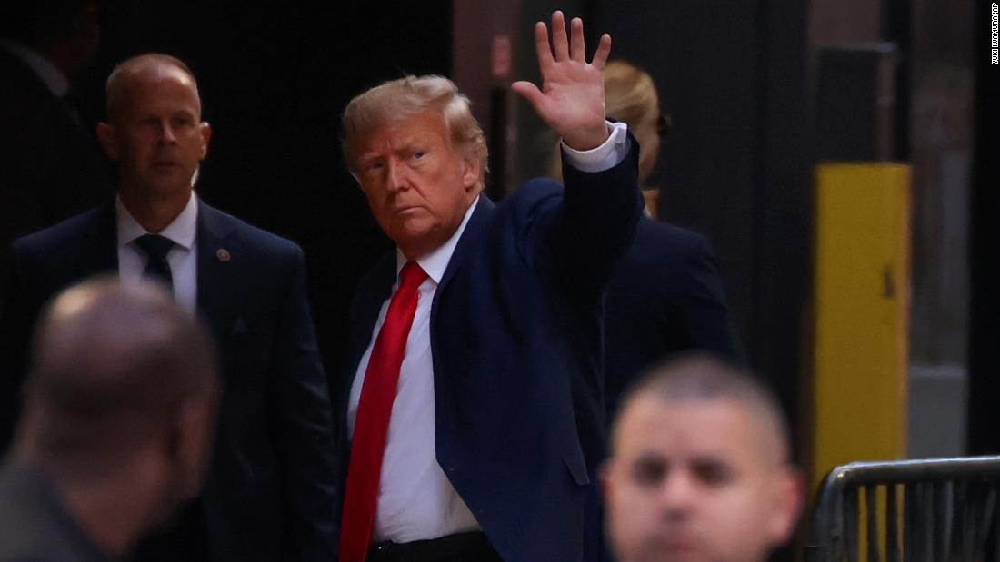

  Image Caption: Former President Donald Trump steps out of his private jet at Teterboro Airport in New Jersey, preparing to travel to New York City for his upcoming indictment hearing.

--------------------------------------------------

2. Haberman reveals why Trump attacked judge and his family in speech
  Summary: The feedback highlights several technical problems with the ad’s video playback: the player was slow to load, the video content often never loaded or failed to start after the ad, and the ad itself sometimes froze or didn’t finish loading. Additionally, viewers reported that the audio on the ad was excessively loud. The survey also asks users to rate how relevant the ad is to them, indicating that relevance is being measured alongside these performance issues. Overall, the ad’s poor loading speed, playback failures, and audio volume problems are the main concerns reported.
  Image Caption: Image could not be loaded.

--------------------------------------------------

3. 

In [ ]:
# Run the notebook demo
rss_url = "http://rss.cnn.com/rss/edition.rss"
articles = fetch_rss_articles(rss_url)  

for i, article in enumerate(articles, start=1):
    print(f"{i}. {article['title']}")

    # Summarize
    try:
        summary = summarize_article(article["link"])
        print(f"  Summary: {summary}")
    except Exception as e:
        print(f"  Could not summarize article: {e}")
        summary = "Summary not available."

    # caption image
    if article.get("image"):
        try:
            caption = caption_image(article["image"])
            print(f"  Image Caption: {caption}")
        except Exception as e:
            print(f"   Could not caption image: {e}")

    print("\n" + "-"*50 + "\n")

In [24]:
# demo function
def run_news_demo(rss_url, limit=3):
    articles = fetch_rss_articles(rss_url)  

    for i, article in enumerate(articles, start=1):
        print(f"{i}. {article['title']}")

        # Summarize
        try:
            summary = summarize_article(article["link"])
            print(f"  Summary: {summary}")
        except Exception as e:
            print(f"  Could not summarize article: {e}")
            summary = "Summary not available."

        # caption image
        if article.get("image"):
            try:
                caption = caption_image(article["image"])
                print(f"  Image Caption: {caption}")
            except Exception as e:
                print(f"   Could not caption image: {e}")

        print("\n" + "-"*50 + "\n")


1. How Congressional Leaders Are Positioning Themselves in the Shutdown Fight
  Summary: Congressional leaders from both parties are under intense pressure as a looming budget impasse threatens to shut down the government within days. Republican Senate Majority Leader John Thune faces his first major spending showdown, while House Speaker Mike Johnson scrambles to keep his slim majority intact, aware that a deal with Democrats could cost him his position. Democrats Chuck Schumer and Hakeem Jeffries see the standoff as an opportunity to energize their base, which remains eager to confront President Trump over fiscal policy. The escalating conflict highlights the high political stakes and real‑world consequences of the pending shutdown.


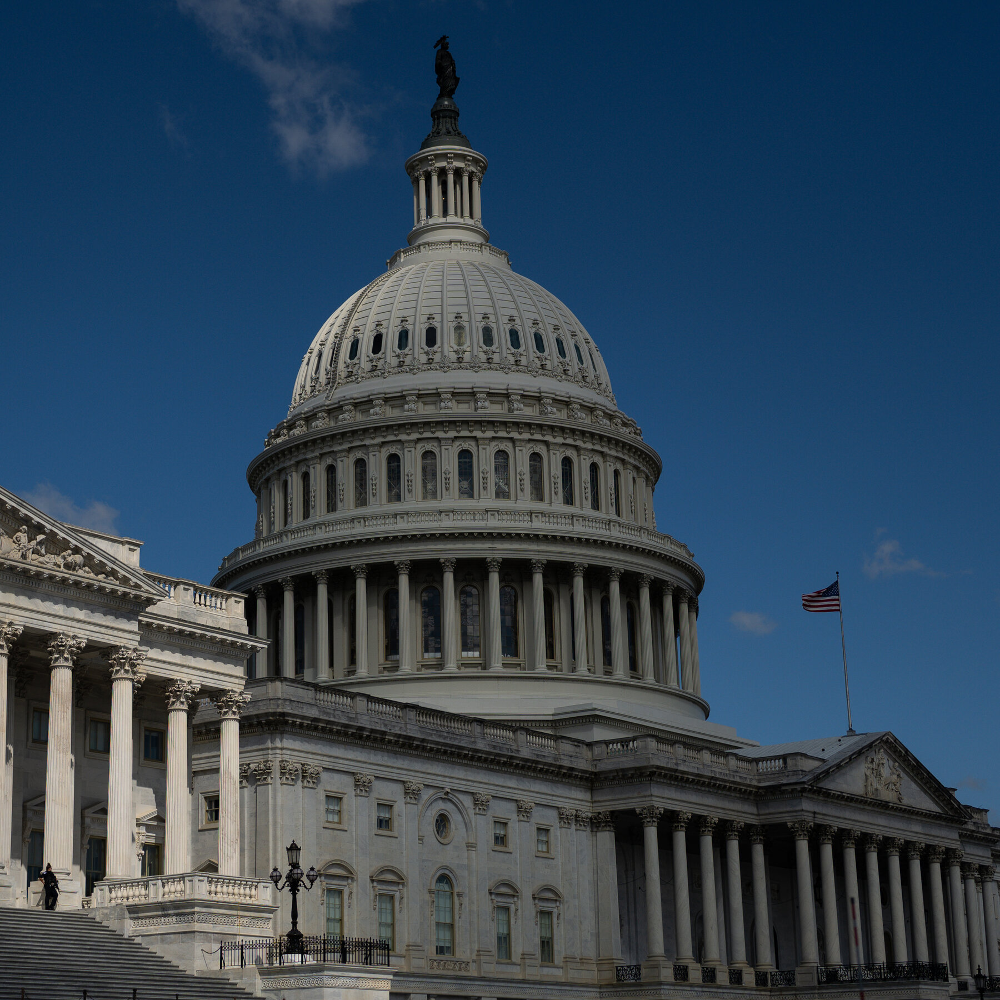

  Image Caption: I’m not able to view images directly. Could you describe what’s shown in the picture? That way I can help craft a concise caption for you.

--------------------------------------------------

2. Read Each Point of Trump’s Plan for an Israel-Gaza Cease-Fire
  Summary: The White House unveiled a comprehensive proposal that would end the Gaza war with an immediate cease‑fire, a rapid hostage‑exchange, and the release of thousands of Palestinian detainees in return for the return of Israeli hostages and the remains of fallen civilians.  It calls for the dismantling of Hamas’s military infrastructure, the establishment of a technocratic Palestinian administration overseen by an internationally‑led “Board of Peace” chaired by former President Donald Trump, and the deployment of a temporary International Stabilization Force to train local police and secure the territory.  The plan also promises massive humanitarian aid, reconstruction of infrastructure, a special economic zon

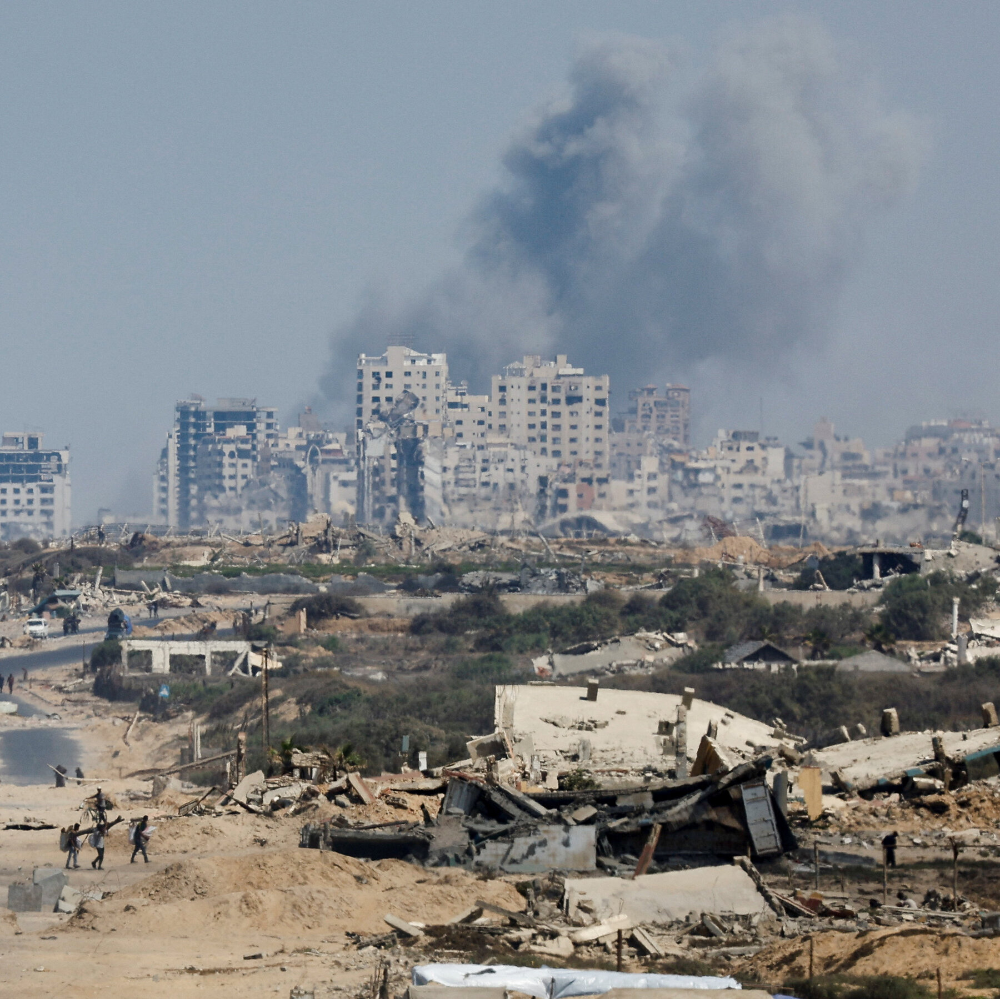

  Image Caption: Israeli Prime Minister Benjamin Netanyahu and U.S. President Joe Biden stand together in front of a banner announcing the newly unveiled 21‑point peace plan, with the flags of Israel and the United States prominently displayed behind them.

--------------------------------------------------

3. Tony Blair Emerges as Potential Figure in Postwar Gaza
  Summary: Tony Blair, who served eight years as the Quartet’s envoy trying to mediate the Israeli‑Palestinian conflict, was appointed to the role in 2007 amid controversy over his support for the Iraq war and his close ties to Israel, which made many Palestinians distrustful. Since leaving office, Blair has continued to work with Arab leaders through his Tony Blair Institute for Global Change, defending his relationship with Saudi Crown Prince Mohammed bin Salman despite the Khashoggi murder scandal. He argues that engaging with Saudi Arabia is essential, citing the Saudi‑U.S.-Israel normalization talks as evidence of a “so

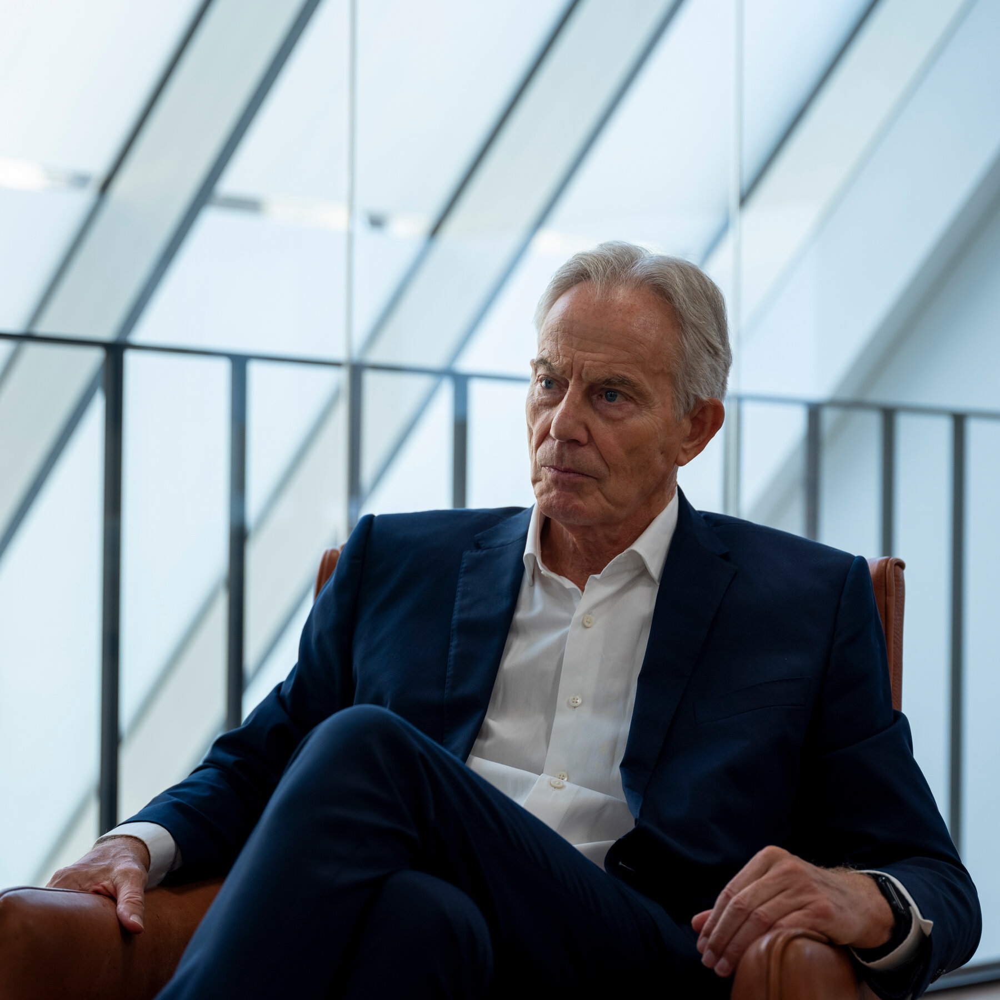

  Image Caption: I’m not able to view images directly. Could you provide a brief description of what’s shown in the picture? That will help me craft an accurate, concise caption for you.

--------------------------------------------------



In [26]:
# another news feed test
rss_url = "https://rss.nytimes.com/services/xml/rss/nyt/HomePage.xml"
run_news_demo(rss_url, limit=3)

In [29]:
# another one
rss_url = "http://feeds.feedburner.com/TechCrunch/"
run_news_demo(rss_url, limit=2)

1. Top 10 AI Tools That Will Transform Your Content Creation in 2025
  Summary: The article highlights ten AI-powered tools that are reshaping content creation in 2025, ranging from text generators like ChatGPT and copywriters such as CopyAI, to visual and video platforms including Canva Magic Studio, MidJourney, RunwayML, Synthesia, and Clickable. It emphasizes how these tools streamline ideation, design, editing, voice‑over, and ad production, offering features such as SEO optimization, brand‑consistent visuals, real‑time video effects, multilingual avatar videos, and viral‑content analytics, often with free tiers and tiered pricing. By integrating these solutions, creators—from marketers and influencers to educators and businesses—can produce higher‑quality, faster, and more engaging content while focusing on their unique creative vision.

--------------------------------------------------

2. LimeWire AI Studio Review 2023: Details, Pricing & Features
  Summary: LimeWire, once know

## Note: 
- Summarization works reliably for most articles.
- Image display works for some articles depending on feed structure.
- Captioning currently works only for selected images; improvements can be made to extract main content images consistently.
